## to do the analysis:
-	iloc warnings update to current version.
-	3d plots with bodyweight
- 	auc plots logy axis 


## Plots for manuscript
Which plots:
-   caffeine clearance / doses
-   caffeine half life / doses/kg
Different variants of plot
- only strict data & remove outliers & rest! (describe the criteria of data selection in legend, i.e. healthy, smoking, ...; and outlier removal!); for males oc=F must be inferred -> check and document;
- create rest/unknown category of all data which has missing smoking or oc information.
- all symbols are circles!, only change colors for subgroups: control, smoking, oc, oc-smoking, rest
- Two variants of plot: (i) only raw outputs and (ii) raw outputs + calculated (used different symbol for calculated)
- check errorbars for dose/kg 
- make plot square
- doses in [mg] and [mg/kg]; clearance in [ml/min]; thalf [hr];
- size of marker according to groupsize
- more concise legend,e.g., control (I=190, G=47, TI=2001)
- remove title, remove grid
- add histograms on y-Axis
- add interpolation curve for groups

- Create same plots with outliers + rest (supplement) & clearly mark the outliers and rest with different symbols;




## Manuscript: 

- update figure 3 second image (strict query) (make image legend and write method section ( how was the image created)
- add overview tables in suplements
- substance diagram on left side (add legend , add method section)


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from utils import PkdbModel
from analysis import PlotCategory, create_plots



{'token': '55388d17d53f133a3f7eb7c69dd0874731fe3445'}


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:

def control_idx(data):
    return ( data[ ('smoking', 'choice')] == 'N') \
           & (data.outlier == False) \
           & ((data[ ('oral contraceptives', 'choice')] == 'N') | ((data[('oral contraceptives', 'choice')].isnull()) & (data[('medication', 'choice')] == "N")))

def smoking_idx(data):
    return (data[ ('smoking', 'choice')] == 'Y') \
           & (data.outlier == False) \

def oc_idx(data):
    return (data.outlier == False) \
           & (data[ ('oral contraceptives', 'choice')] == 'Y') 

def outlier_idx(data):
    return  data.outlier == True

def rest_idx(data):
    return (~outlier_idx(data) & ~smoking_idx(data)  & ~oc_idx(data) & ~control_idx(data))

In [4]:

def control_idx_strict(data):
    return ( data[ ('smoking', 'choice')] == 'N') \
           & (data.outlier == False) \
           & (data[ ('oral contraceptives', 'choice')] == 'N')
def smoking_idx_strict(data):
    return (data[ ('smoking', 'choice')] == 'Y') \
         & (data[ ('oral contraceptives', 'choice')] == 'N') \
           & (data.outlier == False) 

def oc_idx_strict(data):
    return (data.outlier == False) \
           & (data[ ('oral contraceptives', 'choice')] == 'Y') \
            & (data[ ('smoking', 'choice')] == 'N') 

def oc_smoking_strict(data):
    return (data.outlier == False) \
           & (data[ ('oral contraceptives', 'choice')] == 'Y') \
            & (data[ ('smoking', 'choice')] == 'Y') 

def rest_idx_strict(data):
        return (~control_idx_strict(data) & ~smoking_idx_strict(data) & ~oc_smoking_strict(data)  & ~oc_idx_strict(data) & ~outlier_idx(data))



In [5]:
colors = sns.color_palette("colorblind",n_colors=5)

In [6]:
categories_soft = [              
              PlotCategory(name="UNKOWN", color="darkgray", marker='o', data_idx=rest_idx),
              PlotCategory(name="CONTROL", color=colors[2], marker='o', data_idx=control_idx),
              PlotCategory(name="SMOKING", color=colors[0], marker='o', data_idx=smoking_idx),
              PlotCategory(name="OC", color=colors[3], marker='o', data_idx=oc_idx),
              #PlotCategory(name="outlier", color='red', marker='x', data_idx=outlier_idx),
             ]

In [7]:
categories_strict = [
              PlotCategory(name="UNKOWN", color="darkgray", marker='o', data_idx=rest_idx_strict),
              PlotCategory(name="CONTROL", color=colors[2], marker='o', data_idx=control_idx_strict),
              PlotCategory(name="SMOKING", color=colors[0], marker='o', data_idx=smoking_idx_strict),
              PlotCategory(name="OC", color=colors[3], marker='o', data_idx=oc_idx_strict),
              PlotCategory(name="OC-SMOKING", color=colors[1], marker='o', data_idx=oc_smoking_strict),
              #PlotCategory(name="outlier", color='red', marker='x', data_idx=outlier_idx),
             ]

In [8]:
analyses = ["caffeine_clearance","caffeine_thalf","caffeine_tmax","caffeine_vd","caffeine_auc_inf","caffeine_auc_end","caffeine_kel"]


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 29  G: 41 TI: 359
CONTROL    I: 204 G: 58 TI: 835
SMOKING    I: 85  G: 20 TI: 373
OC         I: 53  G: 6  TI: 105


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 14  G: 37 TI: 297
CONTROL    I: 112 G: 44 TI: 573
SMOKING    I: 68  G: 15 TI: 308
OC         I: 33  G: 4  TI: 65 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 53  G: 43 TI: 415
CONTROL    I: 189 G: 50 TI: 726
SMOKING    I: 80  G: 18 TI: 347
OC         I: 42  G: 4  TI: 74 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 18  G: 37 TI: 301
CONTROL    I: 118 G: 47 TI: 597
SMOKING    I: 75  G: 16 TI: 321
OC         I: 33  G: 4  TI: 65 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 57  G: 52 TI: 472
CONTROL    I: 190 G: 52 TI: 775
SMOKING    I: 62  G: 15 TI: 311
OC         I: 44  G: 6  TI: 96 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 32  G: 45 TI: 381
CONTROL    I: 99  G: 39 TI: 516
SMOKING    I: 54  G: 12 TI: 272
OC         I: 24  G: 4  TI: 56 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 71  G: 52 TI: 507
CONTROL    I: 176 G: 45 TI: 669
SMOKING    I: 66  G: 14 TI: 303
OC         I: 33  G: 4  TI: 65 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 36  G: 45 TI: 385
CONTROL    I: 105 G: 42 TI: 540
SMOKING    I: 61  G: 13 TI: 285
OC         I: 24  G: 4  TI: 56 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 14  G: 41 TI: 365
CONTROL    I: 189 G: 61 TI: 852
SMOKING    I: 77  G: 17 TI: 293
OC         I: 42  G: 6  TI: 94 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 18  G: 33 TI: 268
CONTROL    I: 118 G: 44 TI: 553
SMOKING    I: 75  G: 13 TI: 249
OC         I: 33  G: 4  TI: 65 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 14  G: 33 TI: 264
CONTROL    I: 112 G: 41 TI: 529
SMOKING    I: 68  G: 12 TI: 236
OC         I: 33  G: 4  TI: 65 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 14  G: 33 TI: 264
CONTROL    I: 112 G: 41 TI: 529
SMOKING    I: 68  G: 12 TI: 236
OC         I: 33  G: 4  TI: 65 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 34  G: 52 TI: 470
CONTROL    I: 175 G: 55 TI: 792
SMOKING    I: 62  G: 12 TI: 239
OC         I: 33  G: 6  TI: 85 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 36  G: 41 TI: 352
CONTROL    I: 105 G: 39 TI: 496
SMOKING    I: 61  G: 10 TI: 213
OC         I: 24  G: 4  TI: 56 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 32  G: 41 TI: 348
CONTROL    I: 99  G: 36 TI: 472
SMOKING    I: 54  G: 9  TI: 200
OC         I: 24  G: 4  TI: 56 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 32  G: 41 TI: 348
CONTROL    I: 99  G: 36 TI: 472
SMOKING    I: 54  G: 9  TI: 200
OC         I: 24  G: 4  TI: 56 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 22 TI: 204
CONTROL    I: 68  G: 50 TI: 638
SMOKING    I: 15  G: 11 TI: 138
OC         I: 2   G: 4  TI: 40 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 8   G: 19 TI: 176
CONTROL    I: 24  G: 37 TI: 382
SMOKING    I: 13  G: 9  TI: 109
OC         I: 2   G: 2  TI: 20 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 19 TI: 172
CONTROL    I: 18  G: 34 TI: 358
SMOKING    I: 6   G: 8  TI: 96 
OC         I: 2   G: 2  TI: 20 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 19 TI: 172
CONTROL    I: 18  G: 34 TI: 358
SMOKING    I: 6   G: 8  TI: 96 
OC         I: 2   G: 2  TI: 20 


/home/janekg89/Envs/pkdb_analysis/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 11  G: 27 TI: 250
CONTROL    I: 62  G: 46 TI: 602
SMOKING    I: 14  G: 10 TI: 128
OC         I: 2   G: 4  TI: 40 
OC-SMOKING I: 0   G: 0  TI: 0  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 13  G: 22 TI: 209
CONTROL    I: 19  G: 34 TI: 349
SMOKING    I: 13  G: 9  TI: 109
OC         I: 2   G: 2  TI: 20 
OC-SMOKING I: 0   G: 0  TI: 0  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 9   G: 22 TI: 205
CONTROL    I: 13  G: 31 TI: 325
SMOKING    I: 6   G: 8  TI: 96 
OC         I: 2   G: 2  TI: 20 
OC-SMOKING I: 0   G: 0  TI: 0  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 9   G: 22 TI: 205
CONTROL    I: 13  G: 31 TI: 325
SMOKING    I: 6   G: 8  TI: 96 
OC         I: 2   G: 2  TI: 20 
OC-SMOKING I: 0   G: 0  TI: 0  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 14  G: 41 TI: 344
CONTROL    I: 109 G: 54 TI: 706
SMOKING    I: 72  G: 14 TI: 285
OC         I: 28  G: 6  TI: 84 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 14  G: 37 TI: 297
CONTROL    I: 97  G: 40 TI: 524
SMOKING    I: 63  G: 10 TI: 240
OC         I: 28  G: 4  TI: 64 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 14  G: 43 TI: 376
CONTROL    I: 142 G: 45 TI: 615
SMOKING    I: 63  G: 12 TI: 255
OC         I: 37  G: 4  TI: 73 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 18  G: 37 TI: 301
CONTROL    I: 103 G: 43 TI: 548
SMOKING    I: 70  G: 11 TI: 253
OC         I: 28  G: 4  TI: 64 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 33  G: 46 TI: 398
CONTROL    I: 96  G: 52 TI: 681
SMOKING    I: 57  G: 11 TI: 247
OC         I: 19  G: 6  TI: 75 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 31  G: 39 TI: 330
CONTROL    I: 85  G: 39 TI: 502
SMOKING    I: 49  G: 9  TI: 220
OC         I: 19  G: 4  TI: 55 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 31  G: 46 TI: 417
CONTROL    I: 130 G: 44 TI: 593
SMOKING    I: 49  G: 10 TI: 227
OC         I: 28  G: 4  TI: 64 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 35  G: 39 TI: 334
CONTROL    I: 91  G: 42 TI: 526
SMOKING    I: 56  G: 10 TI: 233
OC         I: 19  G: 4  TI: 55 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 8   G: 21 TI: 190
CONTROL    I: 125 G: 34 TI: 518
SMOKING    I: 56  G: 8  TI: 155
OC         I: 26  G: 1  TI: 35 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 12  G: 19 TI: 173
CONTROL    I: 89  G: 31 TI: 386
SMOKING    I: 57  G: 7  TI: 144
OC         I: 26  G: 1  TI: 35 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 8   G: 19 TI: 169
CONTROL    I: 89  G: 29 TI: 374
SMOKING    I: 56  G: 7  TI: 143
OC         I: 26  G: 1  TI: 35 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 8   G: 19 TI: 169
CONTROL    I: 89  G: 29 TI: 374
SMOKING    I: 56  G: 7  TI: 143
OC         I: 26  G: 1  TI: 35 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 23  G: 25 TI: 239
CONTROL    I: 114 G: 31 TI: 479
SMOKING    I: 43  G: 7  TI: 136
OC         I: 17  G: 1  TI: 26 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 27  G: 23 TI: 222
CONTROL    I: 78  G: 28 TI: 347
SMOKING    I: 44  G: 6  TI: 125
OC         I: 17  G: 1  TI: 26 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 23  G: 23 TI: 218
CONTROL    I: 78  G: 26 TI: 335
SMOKING    I: 43  G: 6  TI: 124
OC         I: 17  G: 1  TI: 26 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 23  G: 23 TI: 218
CONTROL    I: 78  G: 26 TI: 335
SMOKING    I: 43  G: 6  TI: 124
OC         I: 17  G: 1  TI: 26 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 20 TI: 157
CONTROL    I: 18  G: 27 TI: 390
SMOKING    I: 6   G: 7  TI: 150
OC         I: 2   G: 1  TI: 11 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 8   G: 18 TI: 140
CONTROL    I: 18  G: 24 TI: 294
SMOKING    I: 7   G: 6  TI: 139
OC         I: 2   G: 1  TI: 11 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 18 TI: 136
CONTROL    I: 18  G: 22 TI: 282
SMOKING    I: 6   G: 6  TI: 138
OC         I: 2   G: 1  TI: 11 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 18 TI: 136
CONTROL    I: 18  G: 22 TI: 282
SMOKING    I: 6   G: 6  TI: 138
OC         I: 2   G: 1  TI: 11 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 9   G: 21 TI: 172
CONTROL    I: 13  G: 26 TI: 375
SMOKING    I: 6   G: 7  TI: 150
OC         I: 2   G: 1  TI: 11 
OC-SMOKING I: 0   G: 0  TI: 0  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 13  G: 19 TI: 155
CONTROL    I: 13  G: 23 TI: 279
SMOKING    I: 7   G: 6  TI: 139
OC         I: 2   G: 1  TI: 11 
OC-SMOKING I: 0   G: 0  TI: 0  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 9   G: 19 TI: 151
CONTROL    I: 13  G: 21 TI: 267
SMOKING    I: 6   G: 6  TI: 138
OC         I: 2   G: 1  TI: 11 
OC-SMOKING I: 0   G: 0  TI: 0  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 9   G: 19 TI: 151
CONTROL    I: 13  G: 21 TI: 267
SMOKING    I: 6   G: 6  TI: 138
OC         I: 2   G: 1  TI: 11 
OC-SMOKING I: 0   G: 0  TI: 0  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 33 TI: 256
CONTROL    I: 58  G: 31 TI: 391
SMOKING    I: 49  G: 5  TI: 132
OC         I: 31  G: 2  TI: 45 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 8   G: 30 TI: 229
CONTROL    I: 58  G: 29 TI: 325
SMOKING    I: 50  G: 4  TI: 121
OC         I: 31  G: 2  TI: 45 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 30 TI: 225
CONTROL    I: 58  G: 27 TI: 313
SMOKING    I: 49  G: 4  TI: 120
OC         I: 31  G: 2  TI: 45 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 4   G: 30 TI: 225
CONTROL    I: 58  G: 27 TI: 313
SMOKING    I: 49  G: 4  TI: 120
OC         I: 31  G: 2  TI: 45 


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 9   G: 34 TI: 271
CONTROL    I: 53  G: 30 TI: 376
SMOKING    I: 40  G: 5  TI: 123
OC         I: 22  G: 2  TI: 36 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 13  G: 31 TI: 244
CONTROL    I: 53  G: 28 TI: 310
SMOKING    I: 41  G: 4  TI: 112
OC         I: 22  G: 2  TI: 36 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 9   G: 31 TI: 240
CONTROL    I: 53  G: 26 TI: 298
SMOKING    I: 40  G: 4  TI: 111
OC         I: 22  G: 2  TI: 36 
OC-SMOKING I: 9   G: 0  TI: 9  


/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:101: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_individual = df_figure[individual_idx(df_data)]
/home/janekg89/Develop/Pycharm_Projects/pkdb_analysis/analysis.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_group = df_figure[group_idx(df_data)]


UNKOWN     I: 9   G: 31 TI: 240
CONTROL    I: 53  G: 26 TI: 298
SMOKING    I: 40  G: 4  TI: 111
OC         I: 22  G: 2  TI: 36 
OC-SMOKING I: 9   G: 0  TI: 9  


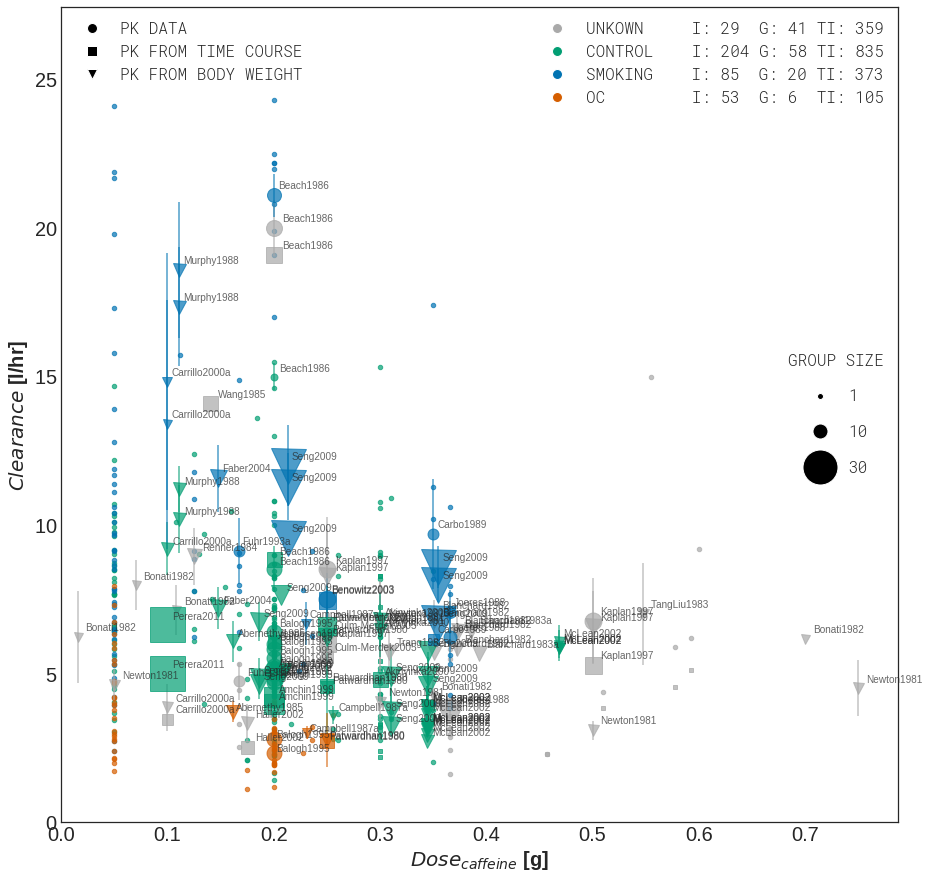

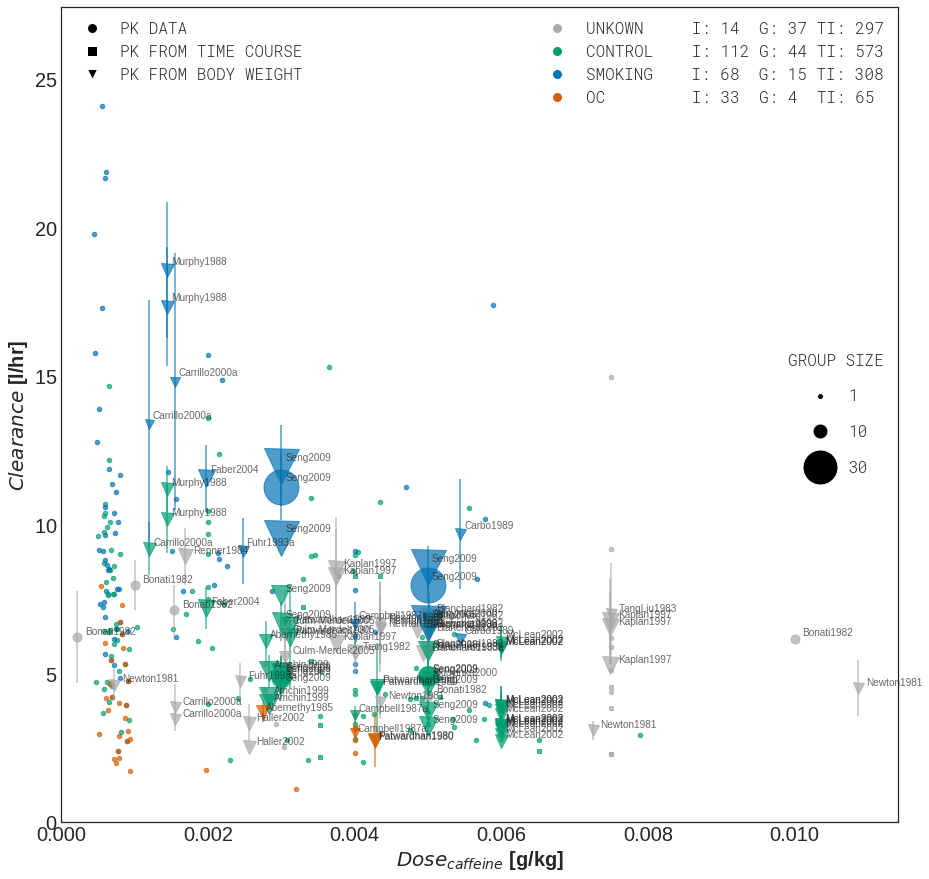

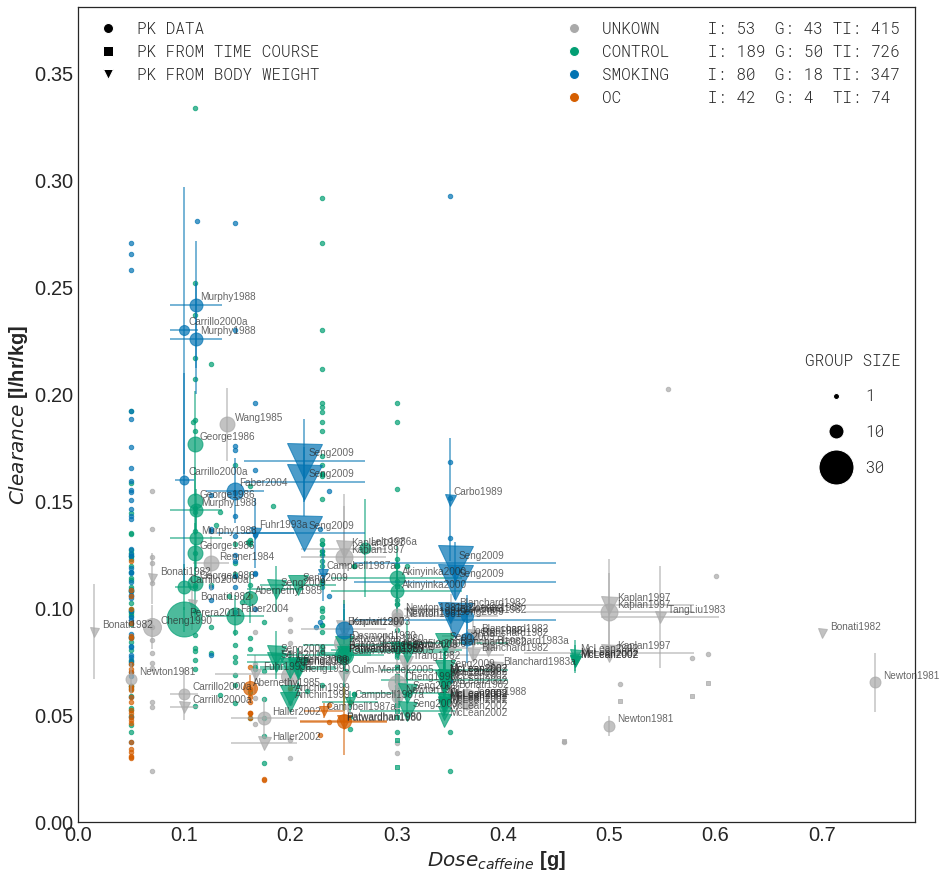

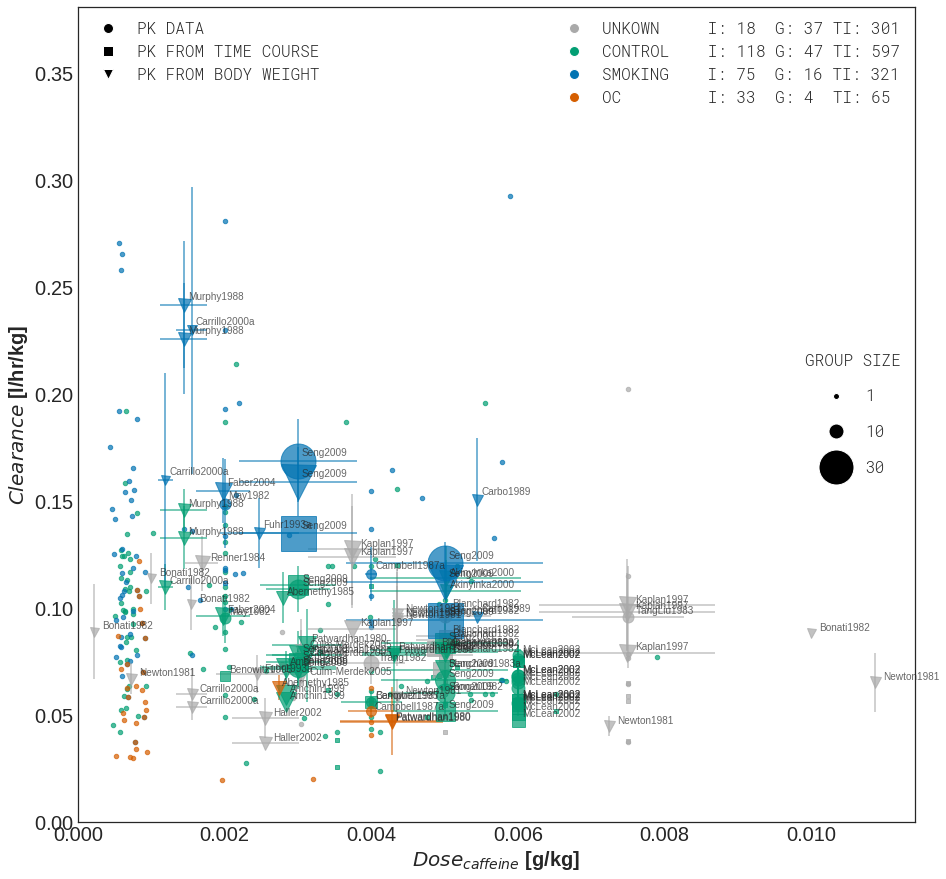

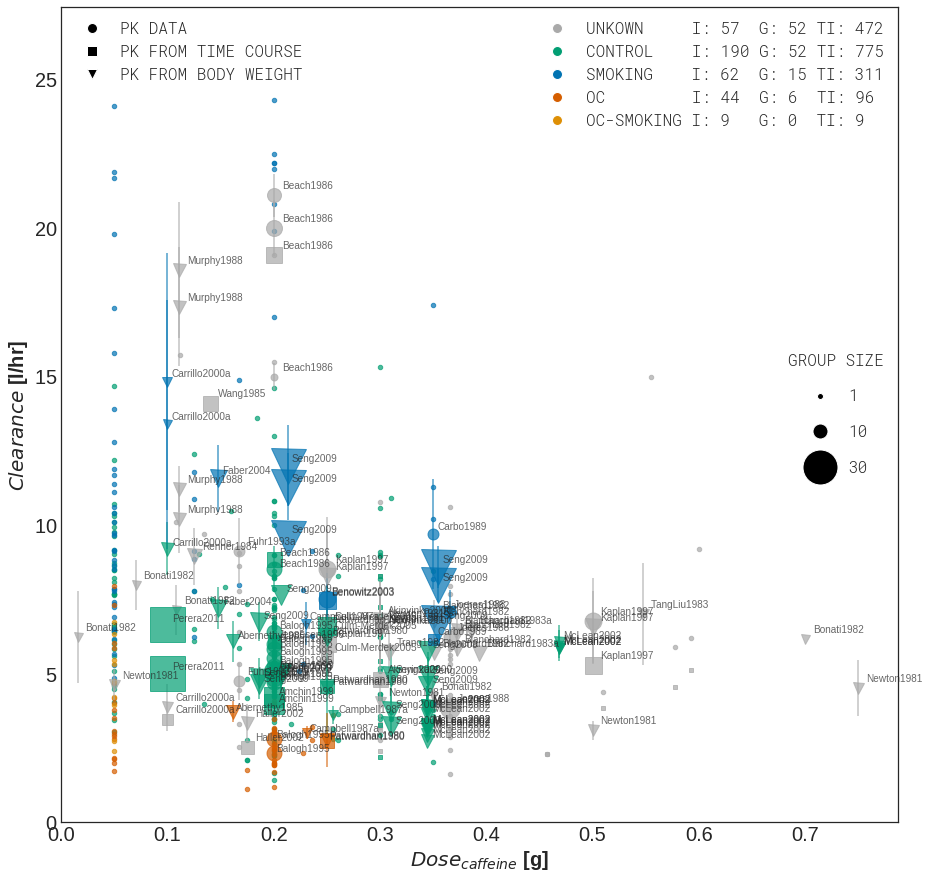

...

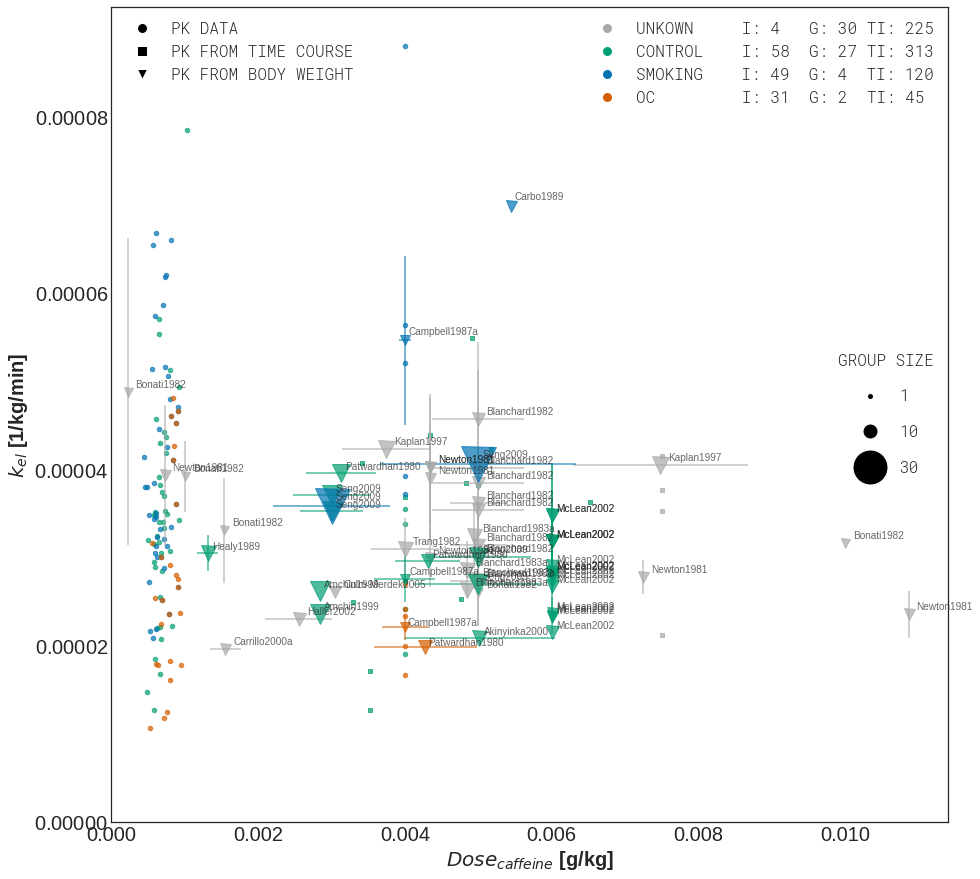

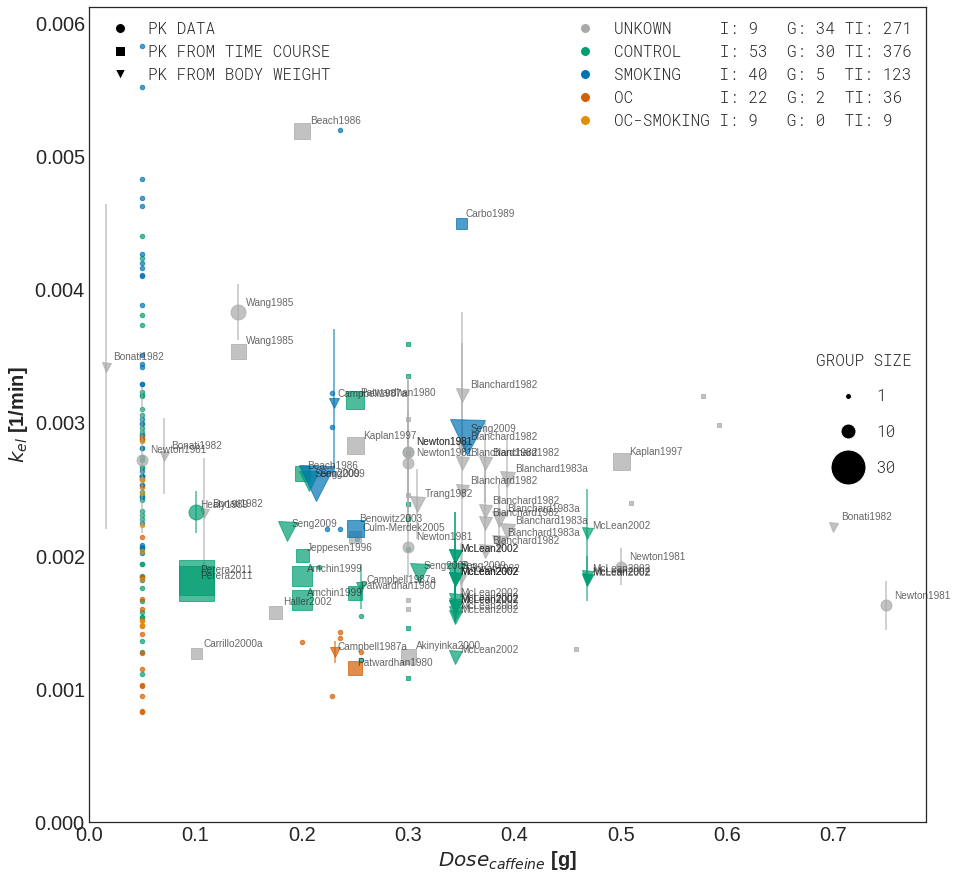

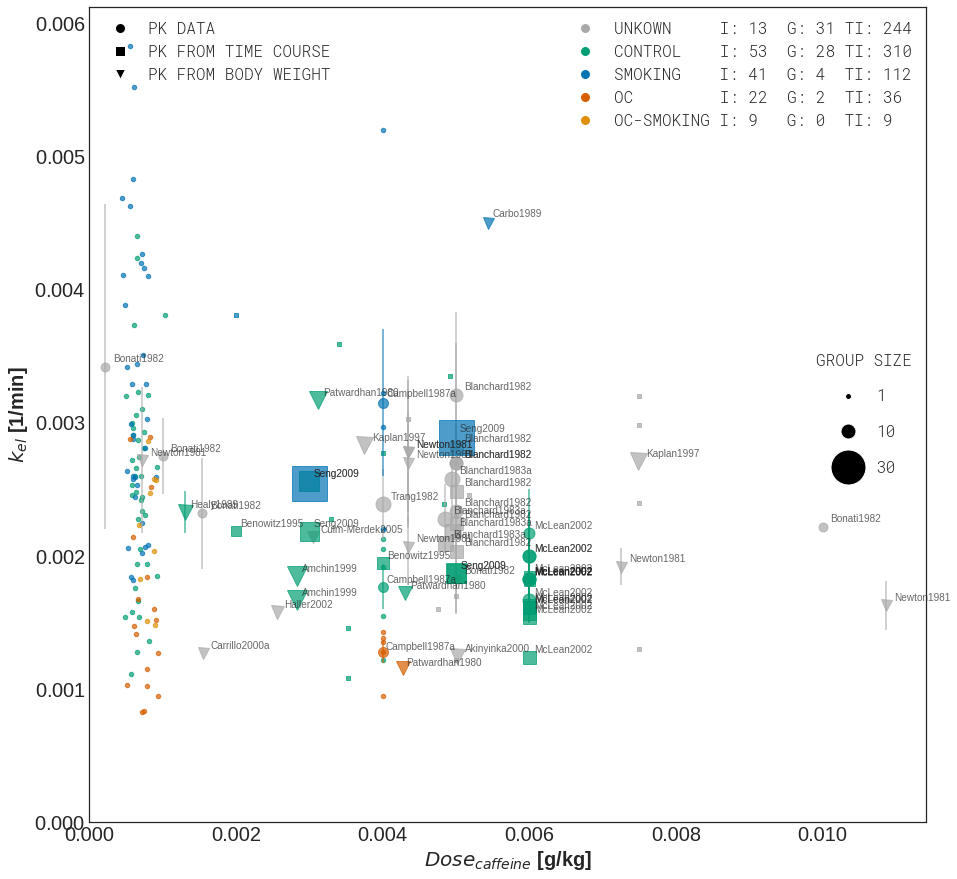

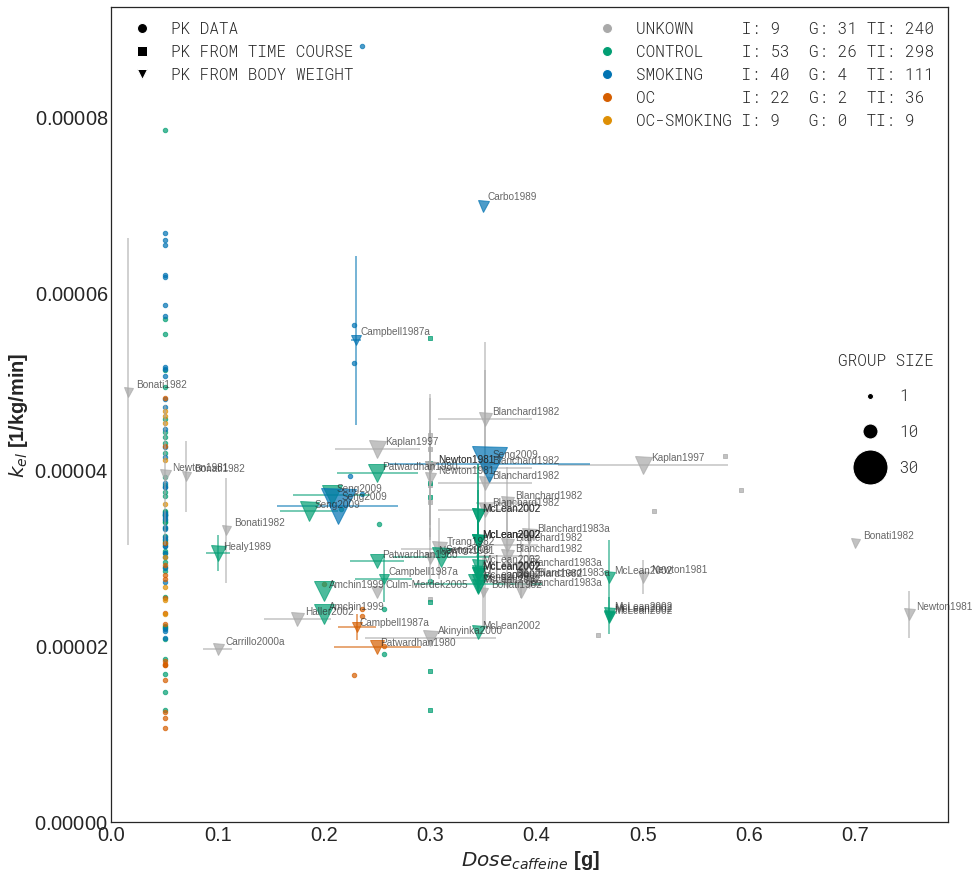

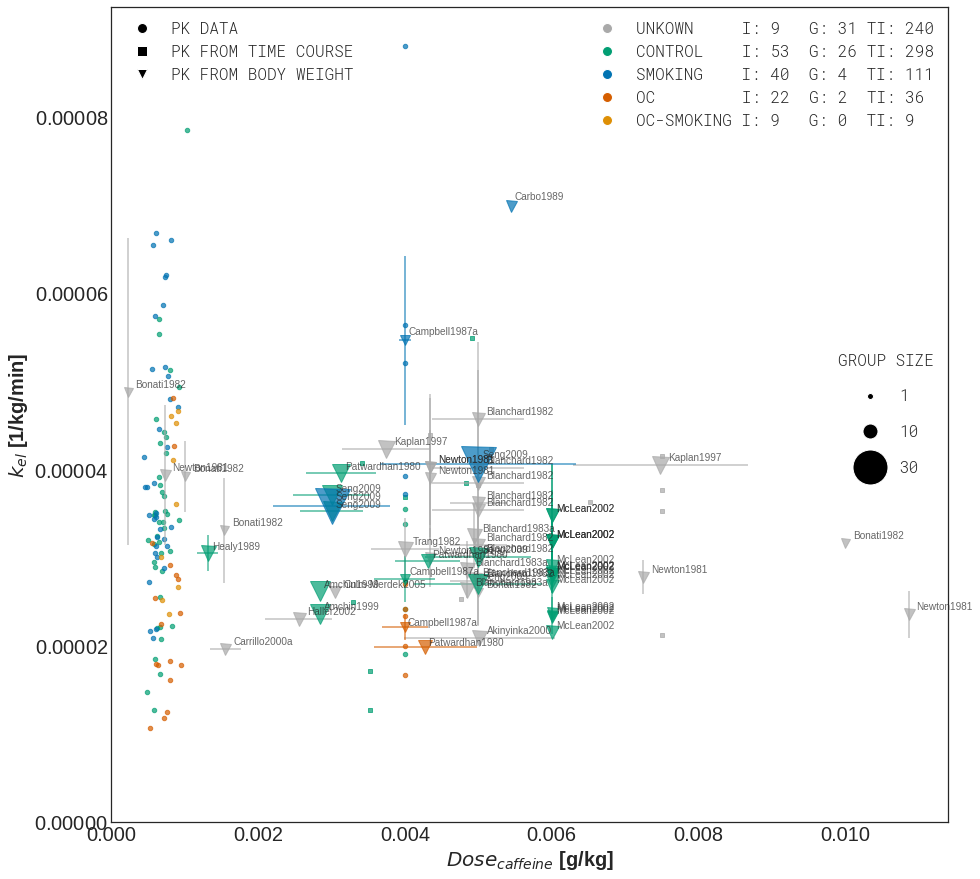

In [9]:
for analysis in analyses:
    data_class = PkdbModel(analysis,destination="3-inferred")
    data_class.read()
    data_class.data["outlier"] = False
    # filter out outliers probably from same clinical study 
    data_class.data.loc[data_class.data["study"]== "Balogh1992","outlier"] = True
    data_class.data.loc[data_class.data["study"]== "Harder1988","outlier"] = True
    data_class.data.loc[data_class.data["study"]== "Harder1989","outlier"] = True
    create_plots(data_class.data,categories_soft,"reports/soft")
    create_plots(data_class.data,categories_strict,"reports/strict")